In [1]:
import pinocchio as pin
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import statsmodels.tools.rng_qrng as rnd

from mujoco_logger import SimLog
from statsmodels.stats.outliers_influence import variance_inflation_factor

MODEL = "two_link"

# Load the URDF model
model = pin.buildModelFromUrdf(f"model/{MODEL}/model.urdf")
data = model.createData()

In [2]:
rnd.check_random_state(42)

Generator(PCG64) at 0x15AD8EB20

In [3]:
np.random.seed(42)

In [4]:
# load data
log = SimLog(f"data/{MODEL}.json")

log[0].qpin, log[0].vpin, log[0].dv, log[0].u

(array([ 2.39034550e-05, -1.98670211e-05]),
 array([ 0.01195173, -0.00993351]),
 array([ 5.97586374, -4.96675528]),
 array([0., 0.]))

In [5]:
A = []
b = []
time = log.time
dt = log[1].time - log[0].time

In [6]:
# numerically differentitate velocity to obtain acceleration
all_vel = [log[i].vpin for i in range(len(log))]
all_vel[0]
# all_acc = np.gradient(all_vel, axis=0) / dt
all_acc = np.diff(all_vel, axis=0) / dt
# expand the first element
all_acc = np.vstack([all_acc[0], all_acc])

# for i in range(len(log)):
for i in range(len(log)):
    # print(all_acc[i])
    regressor = pin.computeJointTorqueRegressor(
        model,
        data,
        log[i].qpin,
        log[i].vpin,
        all_acc[i],
        # log[i].dv,
    )

    # check if regressor is flat
    if len(regressor.shape) != 2:
        A.append(regressor)
    else:
        A.extend(regressor)

    b.extend(log[i].u)

A = np.array(A)
b = np.array(b)

A.shape, b.shape

((20002, 20), (20002,))

In [7]:
x_ground = []
for i in range(1, model.njoints):
    x_ground.extend(model.inertias[i].toDynamicParameters())

x_ground = np.array(x_ground)

x_ground

array([1.        , 0.        , 0.        , 0.3       , 1.09      ,
       0.        , 1.09      , 0.        , 0.        , 1.        ,
       1.        , 0.        , 0.        , 0.1625    , 1.02640625,
       0.        , 1.02640625, 0.        , 0.        , 1.        ])

In [8]:
A_df = pd.DataFrame(A)
b_df = pd.DataFrame(b)

In [9]:
b_df.rename(columns={0: "b"}, inplace=True)
A_df.rename(
    columns={
        0: "m1",
        1: "mrx1",
        2: "mry1",
        3: "mrz1",
        4: "ixx1",
        5: "ixy1",
        6: "ixz1",
        7: "iyy1",
        8: "iyz1",
        9: "izz1",
        10: "m2",
        11: "mrx2",
        12: "mry2",
        13: "mrz2",
        14: "ixx2",
        15: "ixy2",
        16: "ixz2",
        17: "iyy2",
        18: "iyz2",
        19: "izz2",
    },
    inplace=True,
)

In [10]:
Ab_df = pd.concat([A_df, b_df], axis=1, join="inner")
Ab_df

,m1,mrx1,mry1,mrz1,ixx1,ixy1,ixz1,iyy1,iyz1,izz1,...,mrx2,mry2,mrz2,ixx2,ixy2,ixz2,iyy2,iyz2,izz2,b
0,0.0,0.000234,0.0,-9.810000,0.0,0.0,6.002901,0.0,0.0,-0.0,...,0.000200,0.0,-5.768306,0.0,0.0,1.026133,0.0,0.0,0.0,0.000000
1,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000190,0.0,-6.358332,0.0,0.0,1.026133,0.0,0.0,-0.0,0.000000
2,0.0,0.000705,0.0,-9.810000,0.0,0.0,6.002901,0.0,0.0,-0.0,...,0.000681,0.0,-5.768306,0.0,0.0,1.026133,0.0,0.0,0.0,0.060000
3,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.000655,0.0,-6.358332,0.0,0.0,1.026133,0.0,0.0,-0.0,0.020000
4,0.0,0.001411,0.0,-9.810000,0.0,0.0,6.029937,0.0,0.0,-0.0,...,0.001450,0.0,-5.742971,0.0,0.0,1.043157,0.0,0.0,0.0,0.120000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19997,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,23.327060,0.0,48.402461,0.0,0.0,1.230696,0.0,0.0,-0.0,9.113056
19998,0.0,9.807943,0.0,-0.200864,0.0,0.0,13.731070,0.0,0.0,-0.0,...,19.095859,0.0,42.719458,0.0,0.0,1.228516,0.0,0.0,0.0,27.363818
19999,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,23.884749,0.0,48.456810,0.0,0.0,1.228516,0.0,0.0,-0.0,9.121273
20000,0.0,9.809956,0.0,-0.029368,0.0,0.0,13.632738,0.0,0.0,-0.0,...,19.592631,0.0,42.804062,0.0,0.0,1.227989,0.0,0.0,0.0,27.388358


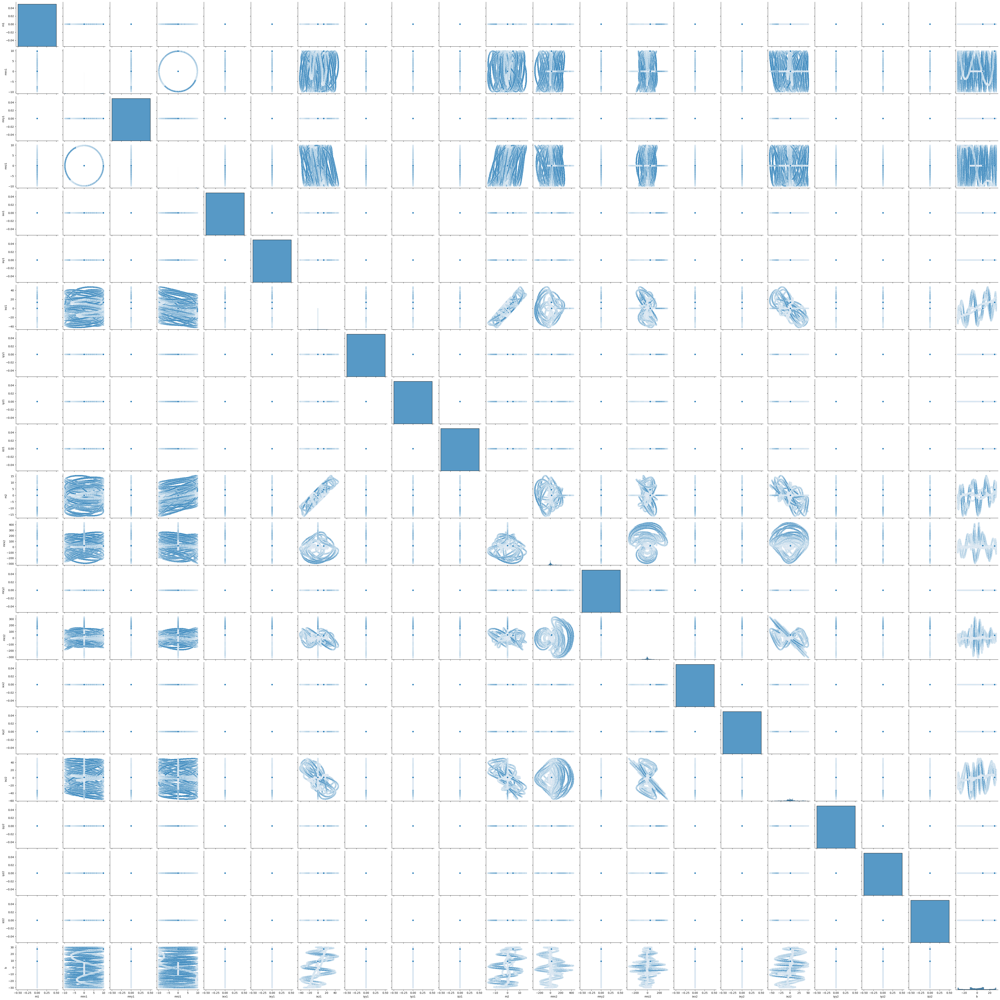

In [11]:
sns.pairplot(Ab_df)

/var/folders/2p/yfych28j5m5b5fwny33xn8500000gn/T/ipykernel_9963/4099298533.py:2: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  Ab_df.hist(grid=False, bins=50, ax=ax)


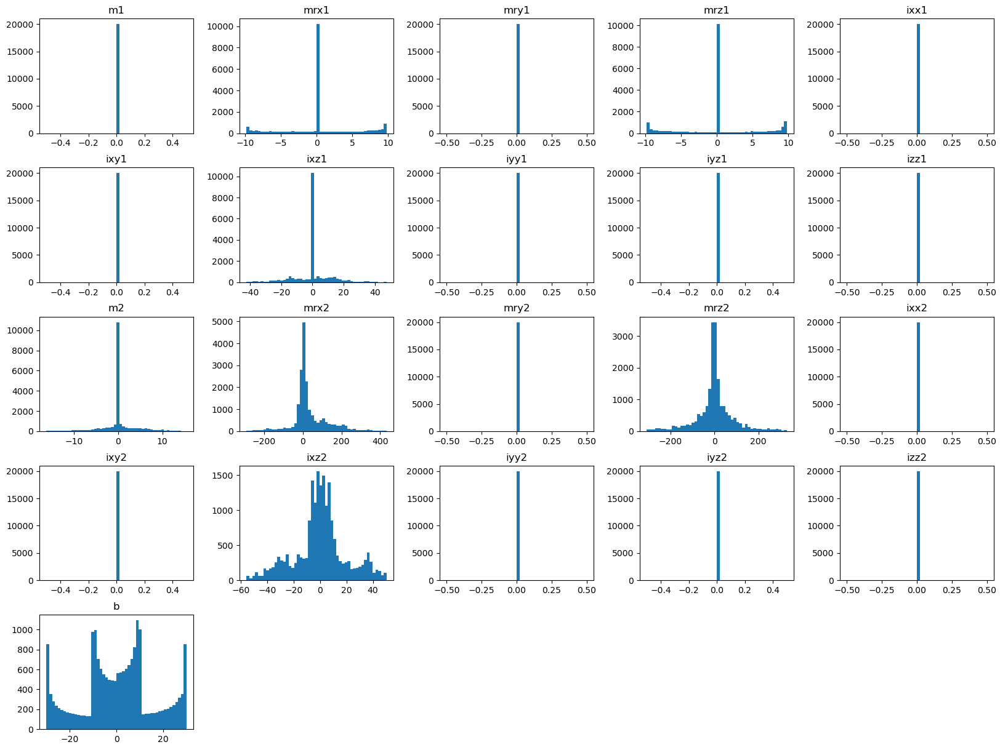

In [12]:
fig, ax = plt.subplots(figsize=(20, 15))
Ab_df.hist(grid=False, bins=50, ax=ax)

fig.savefig("assets/2link-histogram.png")

<Axes: >

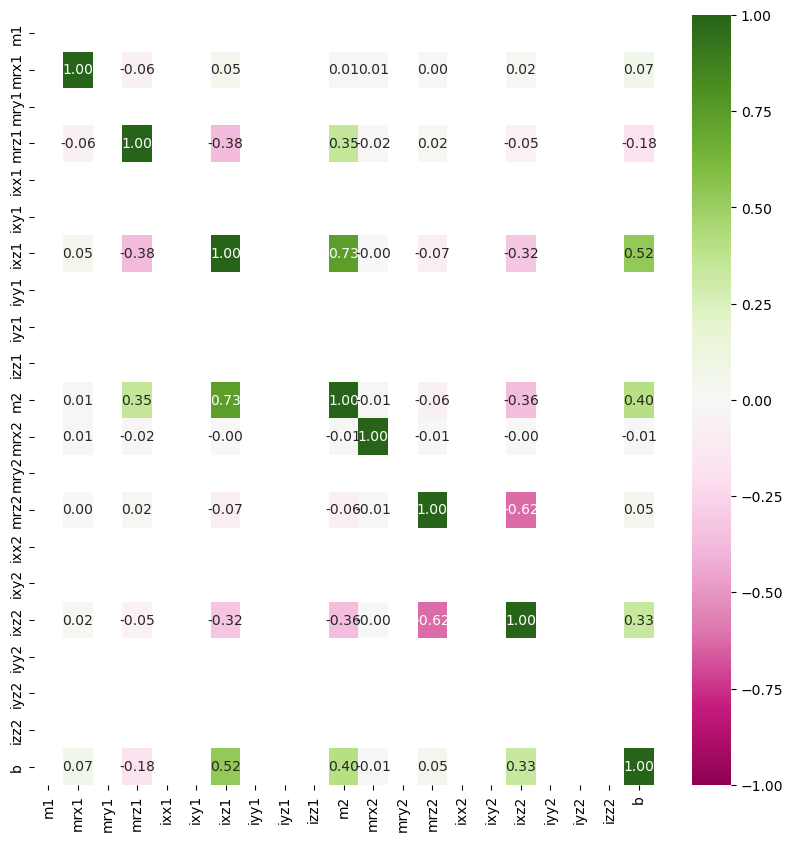

In [13]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Ab_df.corr(), cmap="PiYG", annot=True, fmt=".2f", vmin=-1, vmax=1, ax=ax)

In [14]:
whitelist = ["mrx1", "mrz1", "ixz1", "m2", "mrx2", "mrz2", "ixz2"]

In [15]:
A_small = A_df[whitelist]
Ab_small = pd.concat([A_small, b_df], axis=1, join="inner")

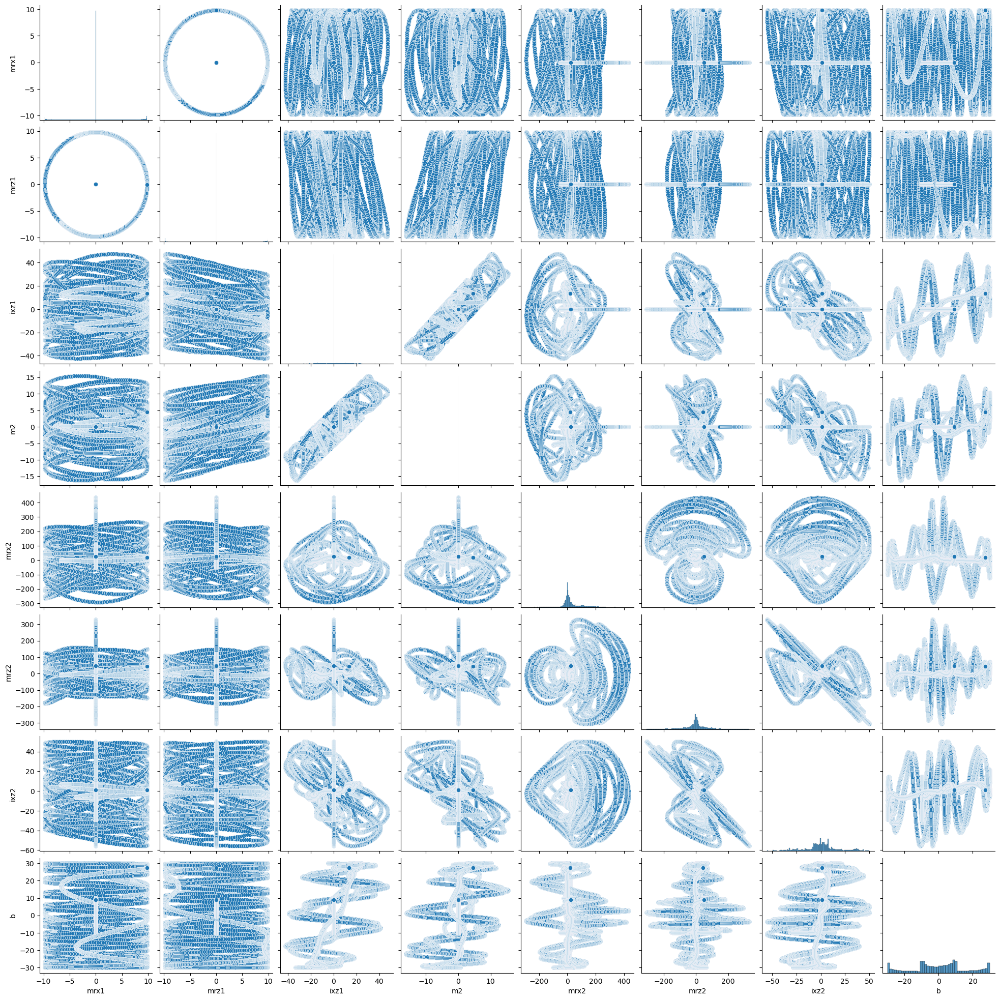

In [16]:
pp_small = sns.pairplot(Ab_small)

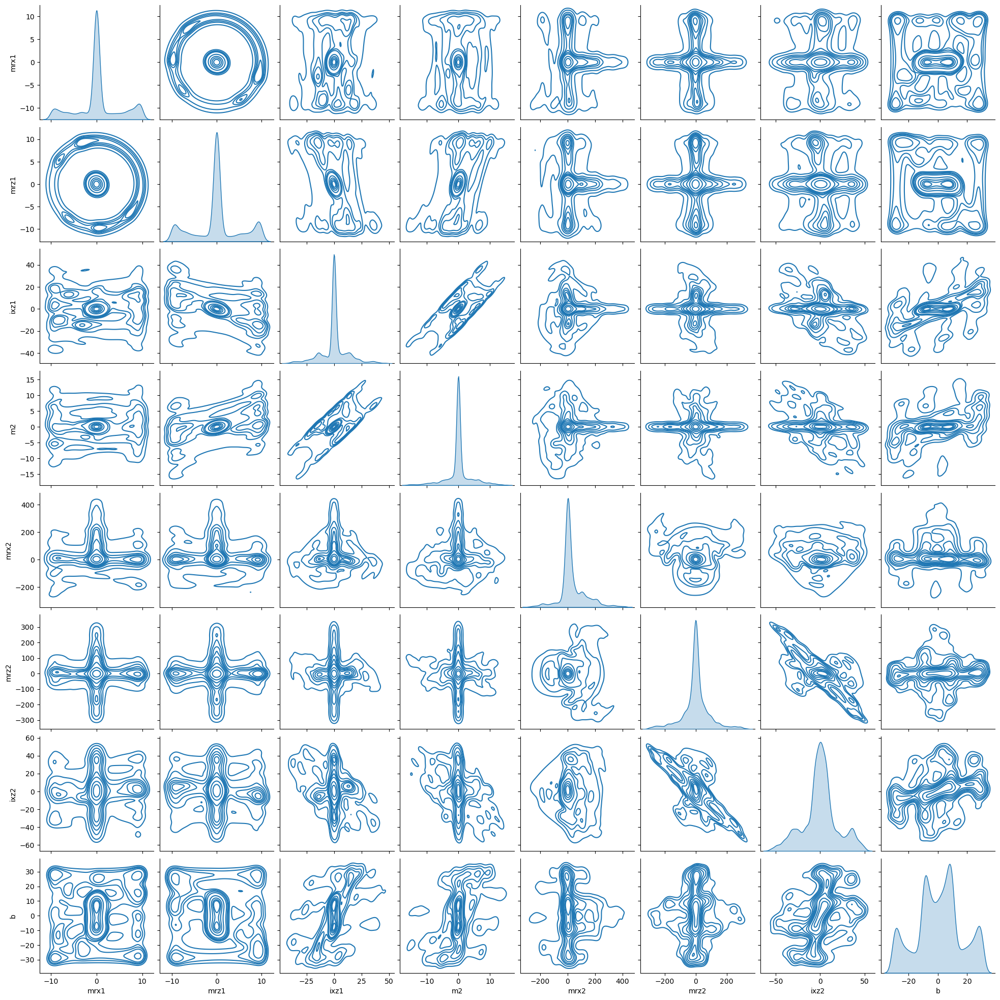

In [17]:
pp_small_kde = sns.pairplot(Ab_small, kind="kde")

In [18]:
pp_small.figure.savefig("assets/2link_pp_small.png")

In [19]:
pp_small_kde.figure.savefig("assets/2link_pp_small_kde.png")

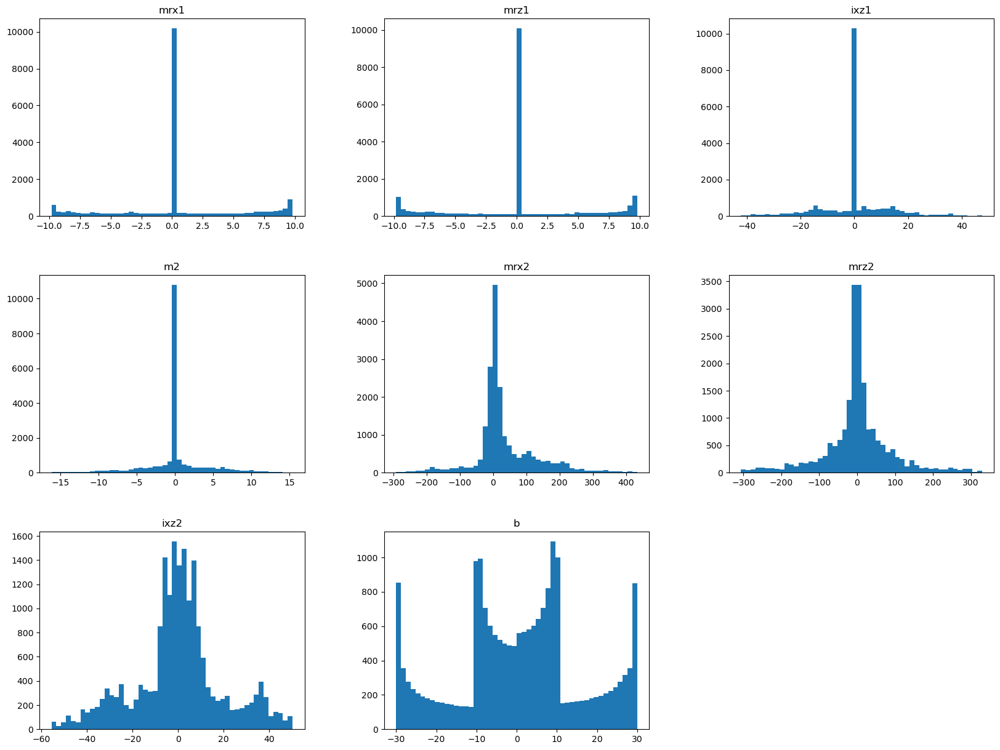

In [20]:
Ab_small.hist(grid=False, bins=50, figsize=(20, 15))
plt.show()

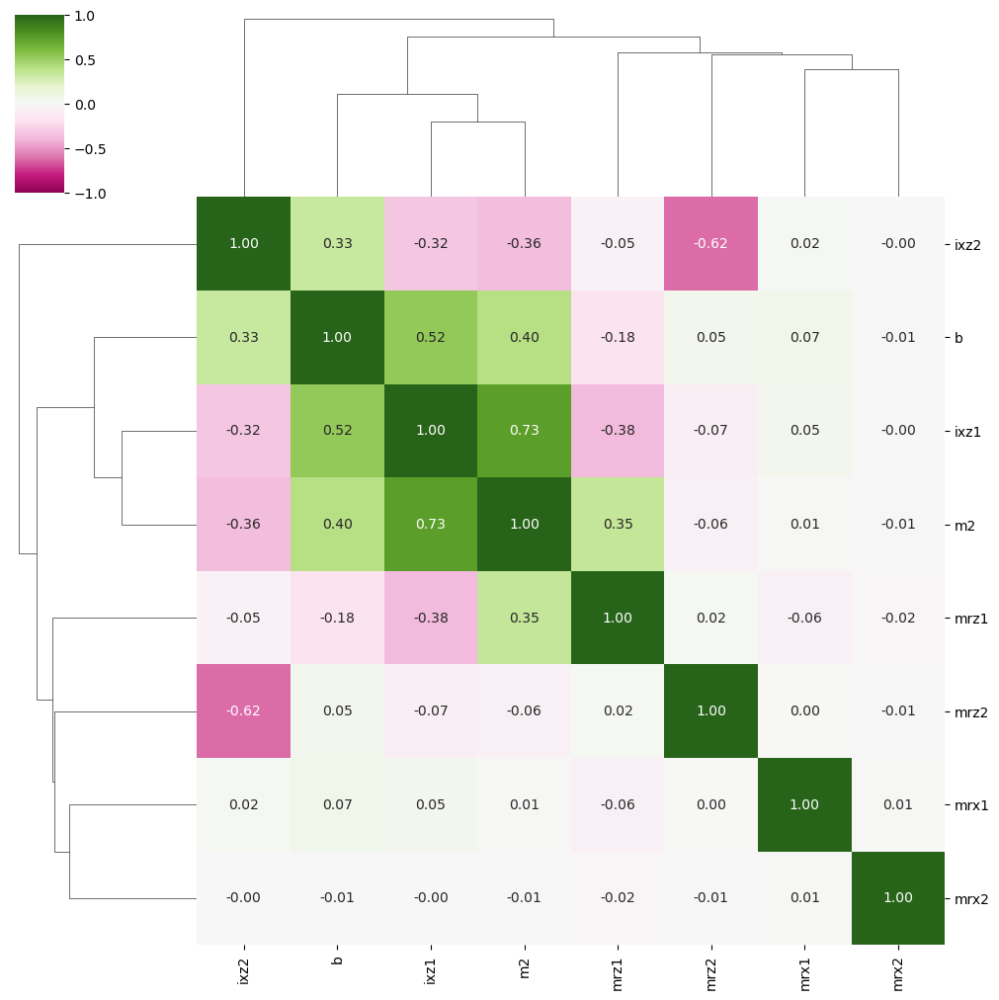

In [21]:
corr_Abs = Ab_small.corr(method="pearson")

# Customize the heatmap of the corr_meat correlation matrix
fig = sns.clustermap(
    corr_Abs,
    row_cluster=True,
    col_cluster=True,
    figsize=(10, 10),
    cmap="PiYG",
    annot=True,
    fmt=".2f",
    vmin=-1,
    vmax=1,
)

plt.setp(fig.ax_heatmap.xaxis.get_majorticklabels(), rotation=90)
plt.setp(fig.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)

fig.savefig("assets/2link_corr_Abs.png")

<Axes: >

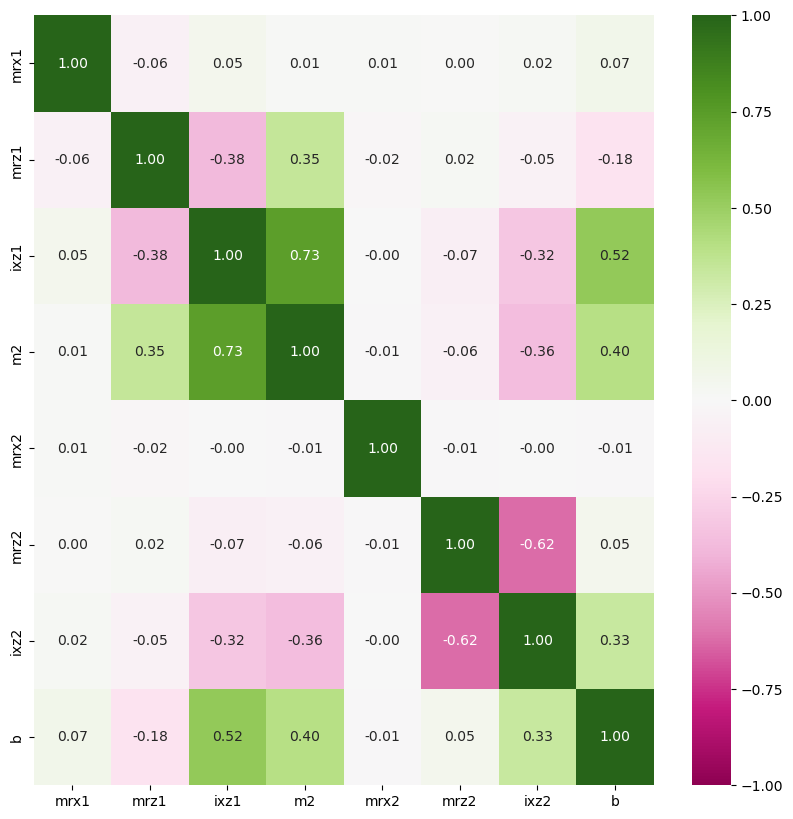

In [22]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(Ab_small.corr(), cmap="PiYG", annot=True, fmt=".2f", vmin=-1, vmax=1, ax=ax)

In [23]:
X = A_small
y = b

model = sm.OLS(y, X)
results = model.fit(cov_type="HC1")
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.828e+07
Date:                Tue, 12 Mar 2024   Prob (F-statistic):                        0.00
Time:                        23:43:33   Log-Likelihood:                         -3205.2
No. Observations:               20002   AIC:                                      6422.
Df Residuals:                   19996   BIC:                                      6470.
Df Model:                           6                                                  
Covariance Type:                  HC1                                                  
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------

/Users/m8dotpie/miniforge3/envs/s24-stdsr/lib/python3.10/site-packages/statsmodels/base/model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 7, but rank is 6
  warnings.warn('covariance of constraints does not have full '


In [24]:
x_ground_small = x_ground[[A_df.columns.get_loc(c) for c in whitelist]]
x_ground_small

array([0.        , 0.3       , 1.09      , 1.        , 0.        ,
       0.1625    , 1.02640625])

In [25]:
def conf_test(ground, pred, offsets):
    conf_intx = pred.conf_int()[0]
    conf_inty = pred.conf_int()[1]

    left_offsets = np.abs(np.array([conf_intx - ground]))[0]
    right_offsets = np.abs(np.array([conf_inty - ground]))[0]

    res = np.zeros(len(ground))

    for i in range(len(ground)):
        if left_offsets[i] < offsets[i] and right_offsets[i] < offsets[i]:
            res[i] = 1

    return res

In [26]:
offsets = np.array([0.3, 0.3, 0.2, 0.5, 0.1, 0.1, 0.1])
conf_test(x_ground_small, results, offsets)

array([1., 1., 1., 1., 1., 1., 1.])

In [27]:
for i in np.arange(1, 100, 1):
    b_noise = b + np.random.normal(0, i, len(b))
    model = sm.OLS(b_noise, X)
    results = model.fit(cov_type="HC1")

    if np.any(conf_test(x_ground_small, results, offsets) < 1):
        print(f"Failed at {i}")
        print("Test result: ", conf_test(x_ground_small, results, offsets))
        print("Ground: ", x_ground_small)
        print("Predicted:\n", results.params)
        print("Summary: --------------")
        print(results.summary())
        break

Failed at 34
Test result:  [1. 0. 1. 1. 1. 1. 1.]
Ground:  [0.         0.3        1.09       1.         0.         0.1625
 1.02640625]
Predicted:
 mrx1    0.022763
mrz1    0.535577
ixz1    1.202798
m2      0.705632
mrx2    0.000997
mrz2    0.164876
ixz2    1.058903
dtype: float64
Summary: --------------
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.184
Model:                            OLS   Adj. R-squared (uncentered):              0.184
Method:                 Least Squares   F-statistic:                              745.6
Date:                Tue, 12 Mar 2024   Prob (F-statistic):                        0.00
Time:                        23:43:33   Log-Likelihood:                         -98680.
No. Observations:               20002   AIC:                                  1.974e+05
Df Residuals:                   19996   BIC:                                  1

/Users/m8dotpie/miniforge3/envs/s24-stdsr/lib/python3.10/site-packages/statsmodels/base/model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 7, but rank is 6
  warnings.warn('covariance of constraints does not have full '


In [28]:
A_small2 = A_small.drop(["mrx1", "mrx2"], axis=1)
A_small2

,mrz1,ixz1,m2,mrz2,ixz2
0,-9.810000,6.002901,-3.656041,-5.768306,1.026133
1,0.000000,0.000000,0.000000,-6.358332,1.026133
2,-9.810000,6.002901,-3.656041,-5.768306,1.026133
3,0.000000,0.000000,0.000000,-6.358332,1.026133
4,-9.810000,6.029937,-3.647102,-5.742971,1.043157
...,...,...,...,...,...
19997,0.000000,0.000000,0.000000,48.402461,1.230696
19998,-0.200864,13.731070,4.424339,42.719458,1.228516
19999,0.000000,0.000000,0.000000,48.456810,1.228516
20000,-0.029368,13.632738,4.490437,42.804062,1.227989


In [29]:
x_ground_small2 = x_ground_small[[A_small.columns.get_loc(c) for c in A_small2.columns]]
x_ground_small2

array([0.3       , 1.09      , 1.        , 0.1625    , 1.02640625])

In [30]:
offsets2 = np.array([0.3, 0.2, 0.5, 0.1, 0.1])

In [31]:
X = A_small2

In [32]:
hist = []
hist_b = []
for i in np.arange(1, 100, 1):
    b_noise = b + np.random.normal(0, i, len(b))
    model = sm.OLS(b_noise, X)
    results = model.fit(cov_type="HC1")

    hist.append(results)
    hist_b.append(b_noise)

    if np.any(conf_test(x_ground_small2, results, offsets2) < 1):
        print(f"Failed at {i}")
        print("Test result: ", conf_test(x_ground_small2, results, offsets2))
        print("Ground: ", x_ground_small2)
        print("Predicted:\n", results.params)
        print("Summary: --------------")
        print(results.summary())
        break

Failed at 34
Test result:  [0. 1. 1. 1. 1.]
Ground:  [0.3        1.09       1.         0.1625     1.02640625]
Predicted:
 mrz1    0.527712
ixz1    1.218290
m2      0.706231
mrz2    0.166657
ixz2    1.038942
dtype: float64
Summary: --------------
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.181
Model:                            OLS   Adj. R-squared (uncentered):              0.180
Method:                 Least Squares   F-statistic:                              1112.
Date:                Tue, 12 Mar 2024   Prob (F-statistic):                        0.00
Time:                        23:43:33   Log-Likelihood:                         -98863.
No. Observations:               20002   AIC:                                  1.977e+05
Df Residuals:                   19998   BIC:                                  1.978e+05
Df Model:                           4             

/Users/m8dotpie/miniforge3/envs/s24-stdsr/lib/python3.10/site-packages/statsmodels/base/model.py:1896: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 5, but rank is 4
  warnings.warn('covariance of constraints does not have full '


In [33]:
x_last = hist[-1].params
x_last.to_numpy()

array([0.52771185, 1.2182896 , 0.70623131, 0.16665683, 1.03894248])

In [34]:
last_b = hist_b[-1]
last_b

array([ -8.60582239,  28.64954586, -22.8711091 , ..., -34.79665977,
        12.04225778, -29.03607162])

In [35]:
A_small2np = A_small2.to_numpy()

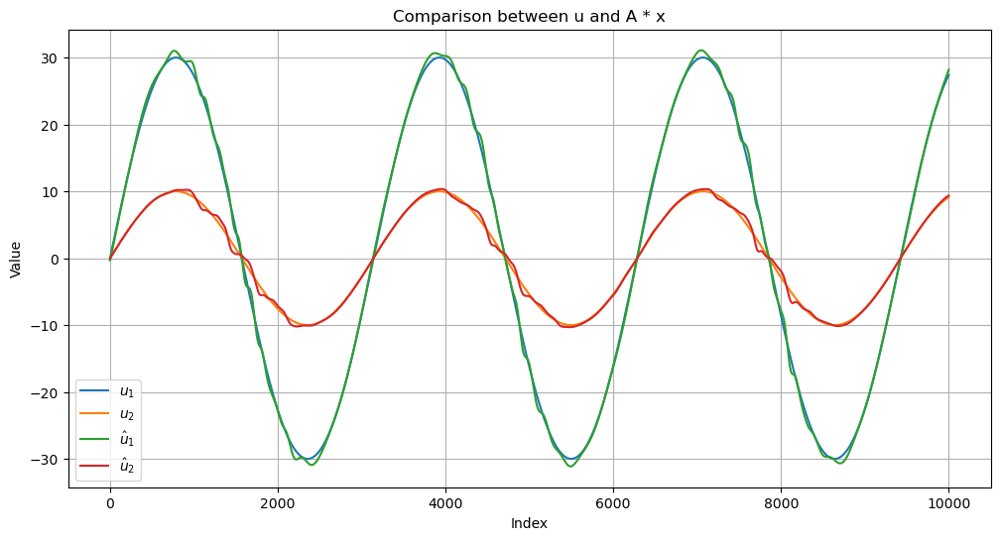

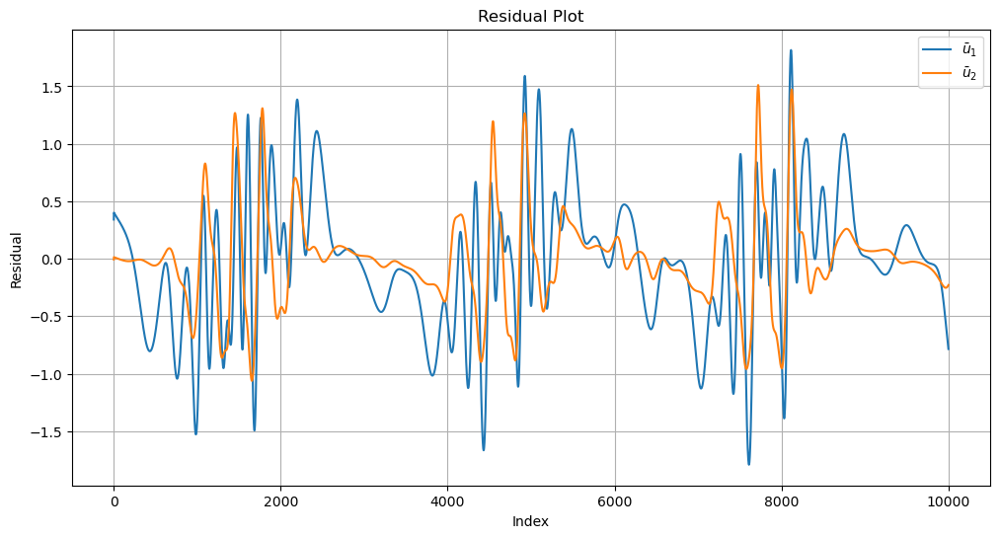

In [36]:
import matplotlib.pyplot as plt

# Plot 1
plt.figure(figsize=(12, 6))
plt.plot(b.reshape(-1, 2), label=["$u_1$", "$u_2$"])
plt.plot((A_small2np @ x_last).reshape(-1, 2), label=["$\hat{u}_1$", "$\hat{u}_2$"])
plt.title("Comparison between u and A * x")
plt.xlabel("Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.savefig("assets/2link_comparison.png")

# Plot 2
plt.figure(figsize=(12, 6))
plt.plot(
    b.reshape(-1, 2) - (A_small2np @ x_last).reshape(-1, 2),
    label=["$\\bar{u}_1$", "$\\bar{u}_2$"],
)
plt.title("Residual Plot")
plt.xlabel("Index")
plt.ylabel("Residual")
plt.legend()
plt.grid(True)
plt.savefig("assets/2link_residual.png")